In [ ]:
pip install tf_explain

In [ ]:
pip install pytorch_tabnet

In [ ]:
pip install optuna


In [ ]:
pip install --upgrade scikit-learn xgboost shap lime

In [ ]:
pip install --upgrade scikit-learn


In [ ]:
pip install --upgrade imbalanced-learn

In [ ]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Load the dataset
file_path = r"D:/New Paper Try/ML/Obesity/New_obesity_levels.csv"
df = pd.read_csv(file_path)

In [ ]:
# Ensure column names match dataset
df.columns = df.columns.str.strip()

# Separate features and target variable
X = df.drop(columns=['target'])  # Features
y = df['target']  # Target variable


In [ ]:
# Apply SMOTE for balancing
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Create a new balanced DataFrame
df_balanced = pd.DataFrame(X_resampled, columns=X.columns)
df_balanced['target'] = y_resampled

# CREATION OF NEW DATASETS

In [ ]:
# Feature Engineering - Creating New Features
df_balanced['BMI'] = df_balanced['Weight'] / (df_balanced['Height'] ** 2)
df_balanced['Hydration_Score'] = df_balanced['CH2O'] / df_balanced['Weight']
df_balanced['Physical_Activity_Score'] = df_balanced['FAF'] * df_balanced['TUE']
df_balanced['Caloric_Risk_Factor'] = df_balanced['FAVC'] * df_balanced['FCVC'] * df_balanced['NCP']
df_balanced['Alcohol_Smoking_Index'] = df_balanced['CALC'] + df_balanced['SMOKE']

df_balanced['Genetic_Lifestyle_Risk'] = df_balanced['family_history_with_overweight'] * df_balanced['Caloric_Risk_Factor']
df_balanced['Obesity_Risk_Score'] = (df_balanced['BMI'] * df_balanced['Caloric_Risk_Factor']) / (df_balanced['Physical_Activity_Score'] + 1)  # Avoid division by zero
df_balanced['Sedentary_Lifestyle_Index'] = 1 / (1 + df_balanced['FAF'] + df_balanced['TUE'])
df_balanced['Meal_Regularity_Score'] = 1 / (1 + abs(df_balanced['NCP'] - 3))

In [ ]:
# Normalize new numerical features (optional, for better ML performance)
scaler = MinMaxScaler()
new_features = ['BMI', 'Hydration_Score', 'Physical_Activity_Score', 
                'Caloric_Risk_Factor', 'Alcohol_Smoking_Index', 'Genetic_Lifestyle_Risk', 
                'Obesity_Risk_Score', 'Sedentary_Lifestyle_Index', 'Meal_Regularity_Score']
df_balanced[new_features] = scaler.fit_transform(df_balanced[new_features])

In [ ]:
# Dataset 1: All old features + new features
df1 = df_balanced.copy()
df1.to_csv("D:/New Paper Try/ML/Obesity/new_data_Full.csv", index=False)

In [ ]:
# Dataset 2: New features + remaining old features (Removing used columns)
columns_to_remove = ['Height', 'Weight', 'CH2O', 'FAF', 'TUE', 'FAVC', 'FCVC', 'NCP', 'CALC', 'SMOKE', 'family_history_with_overweight']
df2 = df_balanced.drop(columns=columns_to_remove)
df2.to_csv("D:/New Paper Try/ML/Obesity/new_data_selected.csv", index=False)

# ENSEMBLE MODELING


In [2]:
import shap
import lime
import lime.lime_tabular
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, Flatten, LSTM
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import StackingClassifier
from sklearn.svm import SVC

In [3]:
# Load datasets
df1 = pd.read_csv(r"D:/New Paper Try/ML/Obesity/new_data_Full.csv")
df2 = pd.read_csv(r"D:/New Paper Try/ML/Obesity/new_data_selected.csv")

# Preprocess datasets
def preprocess_data(df):
    X = df.drop(columns=['target'])
    y = df['target']
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    return X_scaled, y, scaler, X.columns

X1, y1, scaler1, feature_names1 = preprocess_data(df1)
X2, y2, scaler2, feature_names2 = preprocess_data(df2)

# Split datasets
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

# DATASET-1

In [4]:
import numpy as np
import shap
import torch
import optuna
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import LSTM, Bidirectional, Attention, Dense, Dropout, Conv1D, Flatten, Input
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from xgboost import XGBClassifier
from pytorch_tabnet.tab_model import TabNetClassifier
from tf_explain.core.integrated_gradients import IntegratedGradients

In [5]:
# ---------------- Hybrid Model 1: CNN + TabNet ----------------
def build_cnn_model(input_shape):
    model = Sequential([
        Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(4, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

cnn_model = build_cnn_model((X1_train.shape[1], 1))
cnn_model.fit(X1_train.reshape(-1, X1_train.shape[1], 1), y1_train, epochs=10, batch_size=32, verbose=1)

Epoch 1/10
1021/1021 [==============================] - 5s 4ms/step - loss: 0.3204 - accuracy: 0.8843
Epoch 2/10
1021/1021 [==============================] - 4s 4ms/step - loss: 0.2559 - accuracy: 0.9109
Epoch 3/10
1021/1021 [==============================] - 4s 4ms/step - loss: 0.2402 - accuracy: 0.9179
Epoch 4/10
1021/1021 [==============================] - 5s 5ms/step - loss: 0.2321 - accuracy: 0.9213
Epoch 5/10
1021/1021 [==============================] - 6s 6ms/step - loss: 0.2241 - accuracy: 0.9221
Epoch 6/10
1021/1021 [==============================] - 6s 5ms/step - loss: 0.2172 - accuracy: 0.9239
Epoch 7/10
1021/1021 [==============================] - 5s 5ms/step - loss: 0.2138 - accuracy: 0.9250
Epoch 8/10
1021/1021 [==============================] - 5s 5ms/step - loss: 0.2093 - accuracy: 0.9285
Epoch 9/10
1021/1021 [==============================] - 4s 4ms/step - loss: 0.2064 - accuracy: 0.9288
Epoch 10/10
1021/1021 [==============================] - 7s 7ms/step - loss: 0.202

In [6]:
# Extract CNN-generated features
cnn_train_features = cnn_model.predict(X1_train.reshape(-1, X1_train.shape[1], 1))
cnn_test_features = cnn_model.predict(X1_test.reshape(-1, X1_test.shape[1], 1))

print (cnn_train_features.shape)

256/256 [==============================] - 0s 1ms/step
(32652, 4)


In [7]:
# Train TabNet on CNN-generated features
tabnet_cnn = TabNetClassifier()
tabnet_cnn.fit(cnn_train_features, y1_train)
cnn_tabnet_preds = tabnet_cnn.predict(cnn_test_features)

print("CNN + TabNet Accuracy:", accuracy_score(y1_test, cnn_tabnet_preds))

C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")
C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 0.45982 |  0:00:02s
epoch 1  | loss: 0.1941  |  0:00:04s
epoch 2  | loss: 0.1885  |  0:00:06s
epoch 3  | loss: 0.18623 |  0:00:09s
epoch 4  | loss: 0.18407 |  0:00:11s
epoch 5  | loss: 0.1821  |  0:00:13s
epoch 6  | loss: 0.18351 |  0:00:15s
epoch 7  | loss: 0.17973 |  0:00:17s
epoch 8  | loss: 0.17901 |  0:00:20s
epoch 9  | loss: 0.17853 |  0:00:22s
epoch 10 | loss: 0.18101 |  0:00:24s
epoch 11 | loss: 0.17977 |  0:00:26s
epoch 12 | loss: 0.17756 |  0:00:28s
epoch 13 | loss: 0.17865 |  0:00:30s
epoch 14 | loss: 0.17683 |  0:00:33s
epoch 15 | loss: 0.17837 |  0:00:35s
epoch 16 | loss: 0.17753 |  0:00:37s
epoch 17 | loss: 0.17848 |  0:00:40s
epoch 18 | loss: 0.17639 |  0:00:43s
epoch 19 | loss: 0.17793 |  0:00:45s
epoch 20 | loss: 0.17793 |  0:00:48s
epoch 21 | loss: 0.17642 |  0:00:51s
epoch 22 | loss: 0.17742 |  0:00:54s
epoch 23 | loss: 0.17729 |  0:00:56s
epoch 24 | loss: 0.17604 |  0:00:59s
epoch 25 | loss: 0.17507 |  0:01:01s
epoch 26 | loss: 0.17724 |  0:01:04s
e

  0%|          | 0/100 [00:00<?, ?it/s]

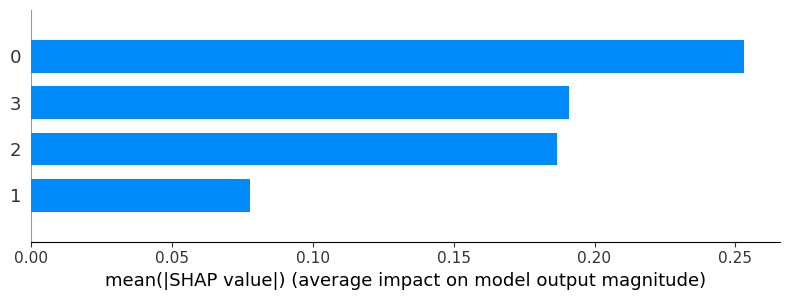

In [8]:
# Import necessary libraries
#--------------- CNN TABNET SHAP------------------------ #

import numpy as np
import pandas as pd
import shap

# Ensure cnn_test_features is a NumPy array
cnn_test_features = np.array(cnn_test_features)

# Convert to DataFrame to preserve feature names
cnn_test_features_df = pd.DataFrame(cnn_test_features)

# Define prediction function for TabNet model
def tabnet_predict(data):
    data = np.array(data)  # Convert to NumPy array
    predictions = tabnet_cnn.predict_proba(data)  # Get probability predictions
    return predictions  # Returns probabilities for all classes

# Sample a subset for background and SHAP computation
background = cnn_test_features_df.sample(n=10, random_state=42)
cnn_test_sample_df = cnn_test_features_df.sample(n=100, random_state=42)
cnn_test_sample = cnn_test_sample_df.values  # Convert to NumPy for KernelExplainer

# Initialize SHAP KernelExplainer with the prediction function and background
explainer_cnn = shap.KernelExplainer(tabnet_predict, background)

# Compute SHAP values using the NumPy array
shap_values_cnn = explainer_cnn.shap_values(cnn_test_sample)
#print("Shape of shap_values_cnn:", shap_values_cnn.shape)


# Debugging: Check the structure of SHAP values
#print("Type of shap_values_cnn:", type(shap_values_cnn))

# If it's 3D, select the first class to visualize
if shap_values_cnn.ndim == 3:
    shap_values_to_plot = shap_values_cnn[:,:,1]  # Select first class's SHAP values
elif shap_values_cnn.ndim == 2:
    shap_values_to_plot = shap_values_cnn  # Directly use if it's already 2D
else:
    raise ValueError(f"Unexpected shape of SHAP values: {shap_values_cnn.shape}")
    
#print("Shape of shap_values_cnn:", shap_values_to_plot.shape)

# Plot SHAP summary using the selected class's values and original DataFrame
shap.summary_plot(shap_values_to_plot, cnn_test_sample_df, plot_type="bar", max_display=30)

In [9]:
# --- CNN+TABNET LIME EXPLANATION ---

import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

# Initialize LIME explainer
explainer_lime = LimeTabularExplainer(
    training_data=cnn_test_features, 
    feature_names=cnn_test_features_df.columns,
    class_names=[str(i) for i in range(tabnet_cnn.predict_proba(cnn_test_features[:1]).shape[1])],
    mode='classification'
)

# Explain a single prediction (e.g., first test sample)
exp = explainer_lime.explain_instance(
    cnn_test_features[0], 
    tabnet_predict, 
    num_features=10
)

# Display LIME explanation
exp.show_in_notebook()

#Optional: Save LIME explanation as HTML

exp.save_to_file('D:/New Paper Try/ML/Obesity/Paper Obesity/Submission/New/cnn_lime_explanation.html')


In [10]:
# ---------------- Hybrid Model 2: Self-Attention BiLSTM + TabNet ----------------
def build_lstm_attention_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Bidirectional(LSTM(64, return_sequences=True))(inputs)
    
    # Self-attention mechanism
    attention = Attention()([x, x])
    
    x = LSTM(32)(attention)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(4, activation='softmax')(x)

    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

lstm_model = build_lstm_attention_model((X1_train.shape[1], 1))
lstm_model.fit(X1_train.reshape(-1, X1_train.shape[1], 1), y1_train, epochs=10, batch_size=32, verbose=1)

Epoch 1/10
1021/1021 [==============================] - 26s 20ms/step - loss: 1.0822 - accuracy: 0.5126
Epoch 2/10
1021/1021 [==============================] - 24s 24ms/step - loss: 0.9724 - accuracy: 0.5736
Epoch 3/10
1021/1021 [==============================] - 21s 21ms/step - loss: 0.8575 - accuracy: 0.6206
Epoch 4/10
1021/1021 [==============================] - 21s 20ms/step - loss: 0.7102 - accuracy: 0.6906
Epoch 5/10
1021/1021 [==============================] - 21s 21ms/step - loss: 0.5790 - accuracy: 0.7577
Epoch 6/10
1021/1021 [==============================] - 22s 21ms/step - loss: 0.4684 - accuracy: 0.8104
Epoch 7/10
1021/1021 [==============================] - 20s 20ms/step - loss: 0.4132 - accuracy: 0.8380
Epoch 8/10
1021/1021 [==============================] - 21s 21ms/step - loss: 0.3623 - accuracy: 0.8613
Epoch 9/10
1021/1021 [==============================] - 21s 21ms/step - loss: 0.3228 - accuracy: 0.8801
Epoch 10/10
1021/1021 [==============================] - 23s 22m

In [11]:
# Extract LSTM-generated features
lstm_train_features = lstm_model.predict(X1_train.reshape(-1, X1_train.shape[1], 1))
lstm_test_features = lstm_model.predict(X1_test.reshape(-1, X1_test.shape[1], 1))

# Train TabNet on LSTM-generated features
tabnet_lstm = TabNetClassifier()
tabnet_lstm.fit(lstm_train_features, y1_train)
lstm_tabnet_preds = tabnet_lstm.predict(lstm_test_features)

print("LSTM + TabNet Accuracy:", accuracy_score(y1_test, lstm_tabnet_preds))

256/256 [==============================] - 2s 7ms/step


C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")
C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 0.54489 |  0:00:02s
epoch 1  | loss: 0.27621 |  0:00:04s
epoch 2  | loss: 0.26811 |  0:00:06s
epoch 3  | loss: 0.2647  |  0:00:08s
epoch 4  | loss: 0.262   |  0:00:10s
epoch 5  | loss: 0.26109 |  0:00:12s
epoch 6  | loss: 0.26097 |  0:00:14s
epoch 7  | loss: 0.25846 |  0:00:16s
epoch 8  | loss: 0.25886 |  0:00:18s
epoch 9  | loss: 0.25771 |  0:00:21s
epoch 10 | loss: 0.25895 |  0:00:23s
epoch 11 | loss: 0.25801 |  0:00:25s
epoch 12 | loss: 0.25617 |  0:00:27s
epoch 13 | loss: 0.25727 |  0:00:29s
epoch 14 | loss: 0.2558  |  0:00:31s
epoch 15 | loss: 0.25777 |  0:00:33s
epoch 16 | loss: 0.25609 |  0:00:35s
epoch 17 | loss: 0.25609 |  0:00:38s
epoch 18 | loss: 0.25602 |  0:00:40s
epoch 19 | loss: 0.25677 |  0:00:42s
epoch 20 | loss: 0.2575  |  0:00:44s
epoch 21 | loss: 0.25493 |  0:00:47s
epoch 22 | loss: 0.25565 |  0:00:51s
epoch 23 | loss: 0.25492 |  0:00:55s
epoch 24 | loss: 0.255   |  0:00:57s
epoch 25 | loss: 0.25481 |  0:00:59s
epoch 26 | loss: 0.25376 |  0:01:01s
e

Test features shape: (8164, 4)


  0%|          | 0/8164 [00:00<?, ?it/s]

Shape of shap_values_lstm: (8164, 4, 4)
Type of shap_values_lstm: <class 'numpy.ndarray'>
Shape of shap_values_lstm: (8164, 4)


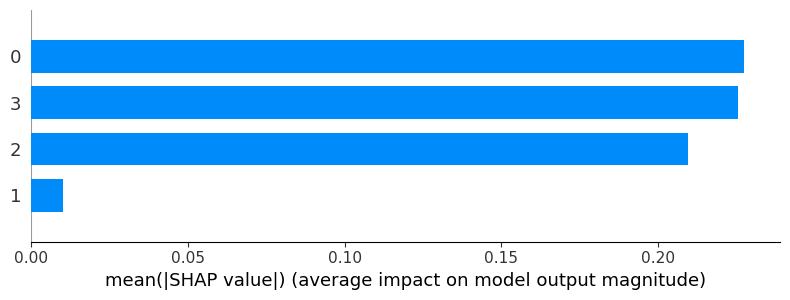

In [12]:
import numpy as np
import shap

# Define the prediction function for LSTM-TabNet
def tabnet_lstm_predict(data):
    data = np.array(data)  # Ensure data is a NumPy array
    predictions = tabnet_lstm.predict_proba(data)  # Get the probability predictions
    return predictions  # Ensure the output is a NumPy array of probabilities

# Ensure the test features are in the correct format (2D array)
lstm_test_features = np.array(lstm_test_features)  # Convert lstm_test_features to a NumPy array if not already

# Convert to DataFrame to preserve feature names
lstm_test_features_df = pd.DataFrame(lstm_test_features)

# Check if lstm_test_features is 2D (n_samples, n_features)
print("Test features shape:", lstm_test_features_df.shape)  # Debugging line to check the shape

# Sample a subset for background and SHAP computation (you can adjust n=10 as per your data size)
background_lstm = lstm_test_features_df.sample(n=10, random_state=42)  # Select 10 samples for background

# Initialize SHAP explainer with the tabnet_lstm_predict function and the background data
explainer_lstm = shap.KernelExplainer(tabnet_lstm_predict, background_lstm)

# Compute SHAP values using the test features
shap_values_lstm = explainer_lstm.shap_values(lstm_test_features_df)
print("Shape of shap_values_lstm:", shap_values_lstm.shape)

# Debugging: Check the structure of SHAP values
print("Type of shap_values_lstm:", type(shap_values_lstm))

# If it's 3D, select the first class to visualize
if shap_values_lstm.ndim == 3:
    shap_values_to_plot_lstm = shap_values_lstm[:,:,1]  # Select first class's SHAP values
elif shap_values_lstm.ndim == 2:
    shap_values_to_plot_lstm = shap_values_lstm  # Directly use if it's already 2D
else:
    raise ValueError(f"Unexpected shape of SHAP values: {shap_values_lstm.shape}")

print("Shape of shap_values_lstm:", shap_values_to_plot_lstm.shape)

# Plot SHAP summary using the selected class's values and original test features
shap.summary_plot(shap_values_to_plot_lstm, lstm_test_features_df, plot_type="bar", max_display=30)


In [13]:
# --- LIME EXPLANATION ---
import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

# Initialize LIME explainer
explainer_lime = LimeTabularExplainer(
    training_data=lstm_test_features, 
    feature_names=lstm_test_features_df.columns,
    class_names=[str(i) for i in range(tabnet_lstm.predict_proba(lstm_test_features[:1]).shape[1])],
    mode='classification'
)

# Explain a single prediction (e.g., first test sample)
exp = explainer_lime.explain_instance(
    lstm_test_features[0], 
    tabnet_lstm_predict, 
    num_features=10
)

# Display LIME explanation
exp.show_in_notebook()
exp.save_to_file('D:/New Paper Try/ML/Obesity/Paper Obesity/Submission/New/lstm_lime_explanation.html')

Test sample shape: (1, 25, 1, 1)


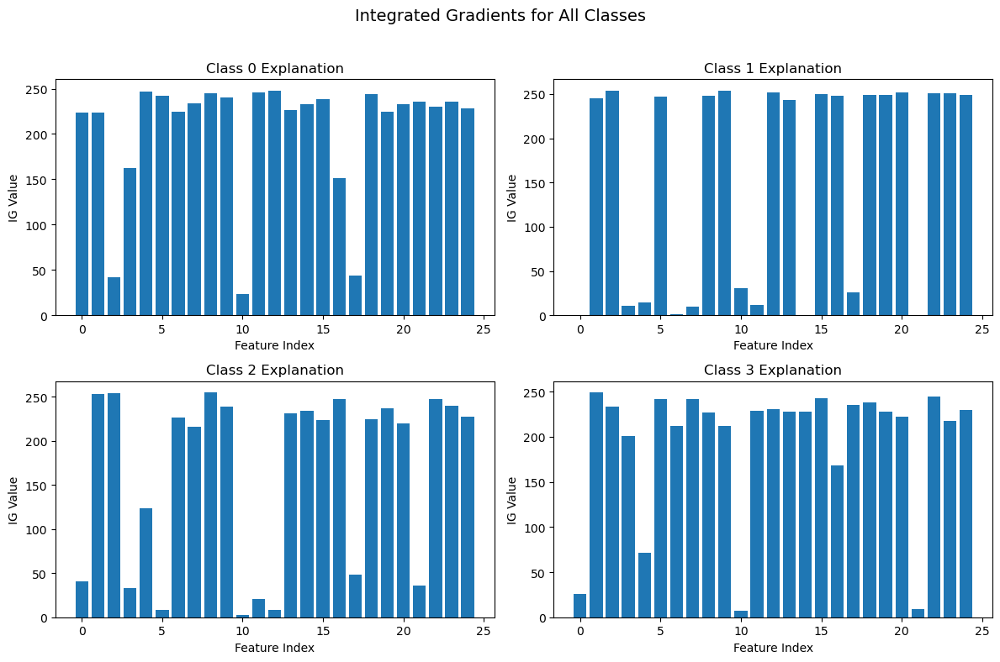

In [20]:
import tensorflow as tf
from tf_explain.core.integrated_gradients import IntegratedGradients
import numpy as np
import matplotlib.pyplot as plt

# Initialize IG Explainer
ig_explainer = IntegratedGradients()

# Reshape test sample for the model
test_sample = np.expand_dims(X1_test[0].reshape(25, 1), axis=0)  # Shape: (1, 25, 1)
test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 25, 1, 1)

# Verify the shape
print("Test sample shape:", test_sample.shape)  # Should be (1, 25, 1, 1)

# Number of classes in your model (change this based on your classification task)
num_classes = 4  

# Create subplots (2x2 grid)
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle("Integrated Gradients for All Classes", fontsize=14)

# Generate and plot IG explanations for all classes
for class_index in range(num_classes):
    # Compute IG explanation for the current class
    ig_explanation = ig_explainer.explain(
        (test_sample, None),
        cnn_model,  
        class_index  
    )

    # Select subplot position
    ax = axes[class_index // 2, class_index % 2]  
    ax.bar(range(len(ig_explanation.flatten())), ig_explanation.flatten())  
    ax.set_xlabel("Feature Index")
    ax.set_ylabel("IG Value")
    ax.set_title(f"Class {class_index} Explanation")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()


Test sample shape: (1, 25, 1, 1)


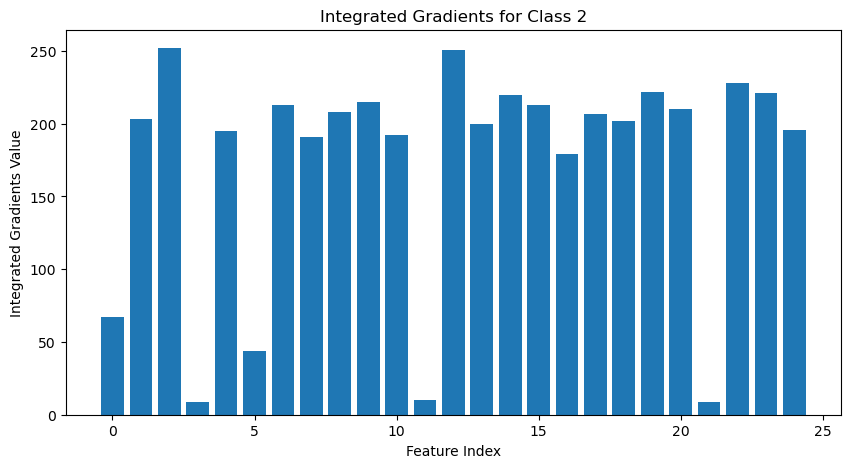

In [24]:
# import tensorflow as tf
# from tf_explain.core.integrated_gradients import IntegratedGradients
# import numpy as np

# import matplotlib.pyplot as plt

# ig_explainer = IntegratedGradients()

# # Correctly reshape the test sample for tf-explain
# test_sample = np.expand_dims(X1_test[0].reshape(25, 1), axis=0)  # Shape: (1, 27, 1)
# test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 27, 1, 1)

# # Verify the new shape
# print("Test sample shape:", test_sample.shape)  # Should be (1, 27, 1, 1)

# # Specify the class index for which you want to explain the prediction
# class_index = 2  # Change this to the class you are interested in

# # Generate IG explanation
# cnn_ig_explanation = ig_explainer.explain(
#     (test_sample, None),  # Input sample in expected format
#     cnn_model,            # Your trained model
#     class_index           # Class index to explain
# )

# # Visualize Integrated Gradients using matplotlib
# # Since cnn_ig_explanation is now a numpy ndarray, we can directly use it
# integrated_gradients = cnn_ig_explanation

# # Plot using matplotlib
# plt.figure(figsize=(10, 5))
# plt.bar(range(len(integrated_gradients.flatten())), integrated_gradients.flatten())  # Flatten in case of multi-dimensional data
# plt.xlabel("Feature Index")
# plt.ylabel("Integrated Gradients Value")
# plt.title(f"Integrated Gradients for Class {class_index}")
# plt.show()

Test sample shape: (1, 25, 1, 1)
Class 0 IG min: 0, max: 253
Class 1 IG min: 0, max: 1
Class 2 IG min: 6, max: 255
Class 3 IG min: 0, max: 255


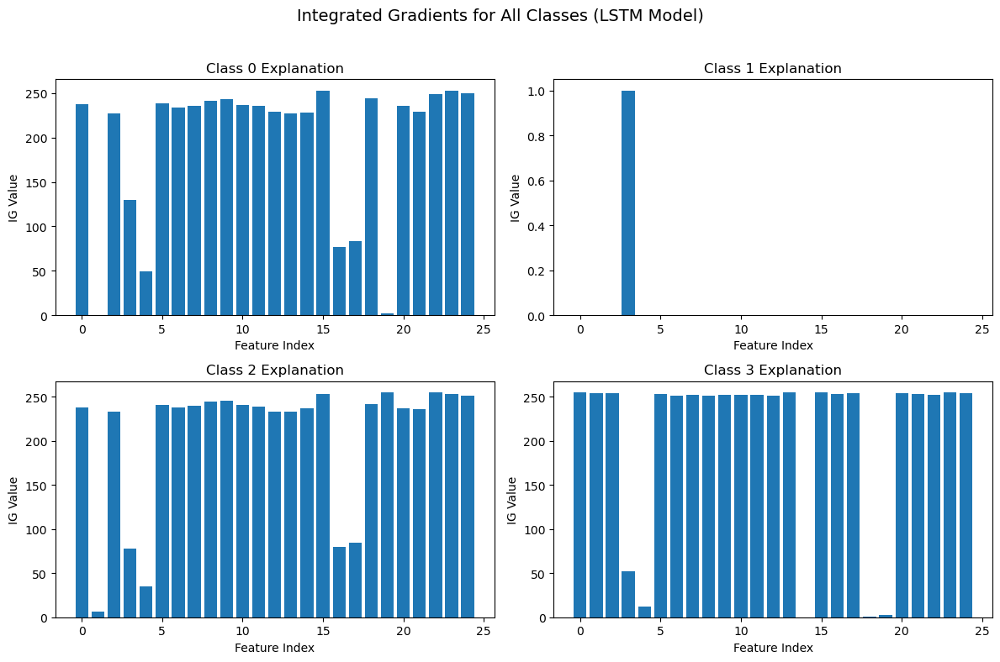

In [21]:
import tensorflow as tf
from tf_explain.core.integrated_gradients import IntegratedGradients
import numpy as np
import matplotlib.pyplot as plt

# Initialize IG Explainer
ig_explainer = IntegratedGradients()

# Reshape test sample for the model
test_sample = np.expand_dims(X1_test[0].reshape(25, 1), axis=0)  # Shape: (1, 25, 1)
test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 25, 1, 1)

# Verify the shape
print("Test sample shape:", test_sample.shape)  # Should be (1, 25, 1, 1)

# Number of classes in the model (update based on your classification task)
num_classes = 4  

# Create subplots (2x2 grid)
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle("Integrated Gradients for All Classes (LSTM Model)", fontsize=14)

# Generate and plot IG explanations for all classes
for class_index in range(num_classes):
    # Compute IG explanation for the current class
    ig_explanation = ig_explainer.explain(
        (test_sample, None),
        lstm_model,  
        class_index  
    )

    # Convert explanation to NumPy array (ensuring no data issues)
    integrated_gradients = np.array(ig_explanation).flatten()

    # Debugging: Check if IG values are being computed for each class
    print(f"Class {class_index} IG min: {integrated_gradients.min()}, max: {integrated_gradients.max()}")

    # Select subplot position
    ax = axes[class_index // 2, class_index % 2]  
    ax.clear()  # Ensure subplot is refreshed

    # Ensure there are valid IG values before plotting
    if np.any(integrated_gradients != 0):  
        ax.bar(range(len(integrated_gradients)), integrated_gradients)  
        ax.set_xlabel("Feature Index")
        ax.set_ylabel("IG Value")
        ax.set_title(f"Class {class_index} Explanation")
    else:
        ax.set_title(f"Class {class_index} (No Significant IG Values)")
        ax.set_xticks([])
        ax.set_yticks([])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()


Test sample shape: (1, 25, 1, 1)


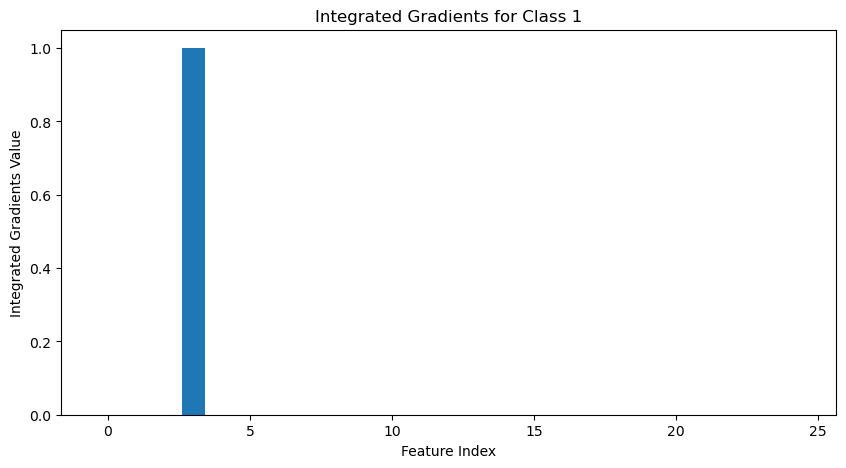

In [22]:
# import tensorflow as tf
# from tf_explain.core.integrated_gradients import IntegratedGradients
# import numpy as np

# import matplotlib.pyplot as plt

# ig_explainer = IntegratedGradients()

# # Correctly reshape the test sample for tf-explain
# test_sample = np.expand_dims(X1_test[0].reshape(25, 1), axis=0)  # Shape: (1, 27, 1)
# test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 27, 1, 1)

# # Verify the new shape
# print("Test sample shape:", test_sample.shape)  # Should be (1, 27, 1, 1)

# # Specify the class index for which you want to explain the prediction
# class_index = 1  # Change this to the class you are interested in

# # Generate IG explanation
# lstm_ig_explanation = ig_explainer.explain(
#     (test_sample, None),  # Input sample in expected format
#     lstm_model,            # Your trained model
#     class_index           # Class index to explain
# )

# # Visualize Integrated Gradients using matplotlib
# # Since cnn_ig_explanation is now a numpy ndarray, we can directly use it
# integrated_gradients = lstm_ig_explanation

# # Plot using matplotlib
# plt.figure(figsize=(10, 5))
# plt.bar(range(len(integrated_gradients.flatten())), integrated_gradients.flatten())  # Flatten in case of multi-dimensional data
# plt.xlabel("Feature Index")
# plt.ylabel("Integrated Gradients Value")
# plt.title(f"Integrated Gradients for Class {class_index}")
# plt.show()



# With Dataset-2

In [23]:
import shap
import lime
import lime.lime_tabular
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, Flatten, LSTM
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import StackingClassifier
from sklearn.svm import SVC
import numpy as np
import shap
import torch
import optuna
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import LSTM, Bidirectional, Attention, Dense, Dropout, Conv1D, Flatten, Input
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from xgboost import XGBClassifier
from pytorch_tabnet.tab_model import TabNetClassifier
from tf_explain.core.integrated_gradients import IntegratedGradients

In [24]:
# Load datasets
df1 = pd.read_csv(r"D:/New Paper Try/ML/Obesity/new_data_Full.csv")
df2 = pd.read_csv(r"D:/New Paper Try/ML/Obesity/new_data_selected.csv")

# Preprocess datasets
def preprocess_data(df):
    X = df.drop(columns=['target'])
    y = df['target']
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    return X_scaled, y, scaler, X.columns

X1, y1, scaler1, feature_names1 = preprocess_data(df1)
X2, y2, scaler2, feature_names2 = preprocess_data(df2)

# Split datasets
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

In [25]:
# ---------------- Hybrid Model 1: CNN + TabNet ----------------
def build_cnn_model(input_shape):
    model = Sequential([
        Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(4,activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

cnn_model = build_cnn_model((X2_train.shape[1], 1))
cnn_model.fit(X2_train.reshape(-1, X2_train.shape[1], 1), y2_train, epochs=10, batch_size=32, verbose=1)

Epoch 1/10
1021/1021 [==============================] - 4s 3ms/step - loss: 0.3519 - accuracy: 0.8742
Epoch 2/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2788 - accuracy: 0.9052
Epoch 3/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2663 - accuracy: 0.9122
Epoch 4/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2596 - accuracy: 0.9130
Epoch 5/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2521 - accuracy: 0.9160
Epoch 6/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2495 - accuracy: 0.9169
Epoch 7/10
1021/1021 [==============================] - 4s 4ms/step - loss: 0.2457 - accuracy: 0.9175
Epoch 8/10
1021/1021 [==============================] - 6s 6ms/step - loss: 0.2436 - accuracy: 0.9177
Epoch 9/10
1021/1021 [==============================] - 5s 5ms/step - loss: 0.2360 - accuracy: 0.9202
Epoch 10/10
1021/1021 [==============================] - 7s 7ms/step - loss: 0.237

In [26]:
# Extract CNN-generated features
cnn_train_features = cnn_model.predict(X2_train.reshape(-1, X2_train.shape[1], 1))
cnn_test_features = cnn_model.predict(X2_test.reshape(-1, X2_test.shape[1], 1))

# Train TabNet on CNN-generated features
tabnet_cnn = TabNetClassifier()
tabnet_cnn.fit(cnn_train_features, y2_train)
cnn_tabnet_preds = tabnet_cnn.predict(cnn_test_features)

print("CNN + TabNet Accuracy:", accuracy_score(y2_test, cnn_tabnet_preds))

256/256 [==============================] - 0s 1ms/step


C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")
C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 0.48316 |  0:00:02s
epoch 1  | loss: 0.24177 |  0:00:03s
epoch 2  | loss: 0.23074 |  0:00:05s
epoch 3  | loss: 0.22834 |  0:00:07s
epoch 4  | loss: 0.22587 |  0:00:09s
epoch 5  | loss: 0.22369 |  0:00:11s
epoch 6  | loss: 0.22244 |  0:00:13s
epoch 7  | loss: 0.22154 |  0:00:15s
epoch 8  | loss: 0.21968 |  0:00:17s
epoch 9  | loss: 0.22112 |  0:00:19s
epoch 10 | loss: 0.22005 |  0:00:21s
epoch 11 | loss: 0.22143 |  0:00:23s
epoch 12 | loss: 0.22077 |  0:00:25s
epoch 13 | loss: 0.21932 |  0:00:27s
epoch 14 | loss: 0.21783 |  0:00:29s
epoch 15 | loss: 0.21963 |  0:00:31s
epoch 16 | loss: 0.21821 |  0:00:33s
epoch 17 | loss: 0.21782 |  0:00:35s
epoch 18 | loss: 0.21872 |  0:00:36s
epoch 19 | loss: 0.21749 |  0:00:39s
epoch 20 | loss: 0.21797 |  0:00:41s
epoch 21 | loss: 0.21698 |  0:00:43s
epoch 22 | loss: 0.21786 |  0:00:45s
epoch 23 | loss: 0.21683 |  0:00:47s
epoch 24 | loss: 0.21721 |  0:00:50s
epoch 25 | loss: 0.21505 |  0:00:52s
epoch 26 | loss: 0.21666 |  0:00:54s
e

[[1.8085527e-03 7.9327903e-04 9.9225396e-01 5.1441947e-03]
 [3.6113374e-02 9.6381098e-01 6.7365167e-05 8.2564884e-06]
 [1.2758746e-02 9.8722923e-01 1.1480462e-05 5.9090013e-07]
 ...
 [2.7303543e-02 9.7248769e-01 2.0584225e-04 2.8961078e-06]
 [6.2422206e-17 1.1372821e-11 4.8304010e-09 1.0000000e+00]
 [7.1856001e-04 3.1733213e-03 9.2838168e-01 6.7726448e-02]]


  0%|          | 0/100 [00:00<?, ?it/s]

Shape of shap_values_cnn: (100, 4, 4)
Type of shap_values_cnn: <class 'numpy.ndarray'>
Shape of shap_values_cnn: (100, 4)


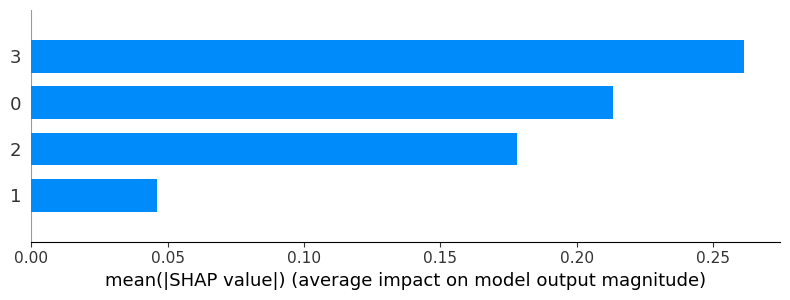

In [27]:
# Import necessary libraries
#----------- CNN+TAbnet SHAP ------------------

import numpy as np
import pandas as pd
import shap

print(cnn_test_features)
# Ensure cnn_test_features is a NumPy array
cnn_test_features = np.array(cnn_test_features)

# Convert to DataFrame to preserve feature names
cnn_test_features_df = pd.DataFrame(cnn_test_features)

# Define prediction function for TabNet model
def tabnet_predict(data):
    data = np.array(data)  # Convert to NumPy array
    predictions = tabnet_cnn.predict_proba(data)  # Get probability predictions
    return predictions  # Returns probabilities for all classes

# Sample a subset for background and SHAP computation
background = cnn_test_features_df.sample(n=10, random_state=42)
cnn_test_sample_df = cnn_test_features_df.sample(n=100, random_state=42)
cnn_test_sample = cnn_test_sample_df.values  # Convert to NumPy for KernelExplainer

# Initialize SHAP KernelExplainer with the prediction function and background
explainer_cnn = shap.KernelExplainer(tabnet_predict, background)

# Compute SHAP values using the NumPy array
shap_values_cnn = explainer_cnn.shap_values(cnn_test_sample)
print("Shape of shap_values_cnn:", shap_values_cnn.shape)


# Debugging: Check the structure of SHAP values
print("Type of shap_values_cnn:", type(shap_values_cnn))

# If it's 3D, select the first class to visualize
if shap_values_cnn.ndim == 3:
    shap_values_to_plot = shap_values_cnn[:,:,1]  # Select first class's SHAP values
elif shap_values_cnn.ndim == 2:
    shap_values_to_plot = shap_values_cnn  # Directly use if it's already 2D
else:
    raise ValueError(f"Unexpected shape of SHAP values: {shap_values_cnn.shape}")
    
print("Shape of shap_values_cnn:", shap_values_to_plot.shape)

# Plot SHAP summary using the selected class's values and original DataFrame
shap.summary_plot(shap_values_to_plot, cnn_test_sample_df, plot_type="bar", max_display=20)

In [28]:
import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

# --- CNN LIME EXPLANATION ---

# Initialize LIME explainer
explainer_lime = LimeTabularExplainer(
    training_data=cnn_test_features, 
    feature_names=cnn_test_features_df.columns,
    class_names=[str(i) for i in range(tabnet_cnn.predict_proba(cnn_test_features[:1]).shape[1])],
    mode='classification'
)

# Explain a single prediction (e.g., first test sample)
exp = explainer_lime.explain_instance(
    cnn_test_features[0], 
    tabnet_predict, 
    num_features=10
)

# Display LIME explanation
exp.show_in_notebook()

# Optional: Save LIME explanation as HTML
exp.save_to_file('D:/New Paper Try/ML/Obesity/Paper Obesity/Submission/New/data2_cnn_explanation.html')


In [29]:
# ---------------- Hybrid Model 2: Self-Attention BiLSTM + TabNet ----------------
def build_lstm_attention_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Bidirectional(LSTM(64, return_sequences=True))(inputs)
    
    # Self-attention mechanism
    attention = Attention()([x, x])
    
    x = LSTM(32)(attention)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(4, activation='softmax')(x)

    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

lstm_model = build_lstm_attention_model((X2_train.shape[1], 1))
lstm_model.fit(X2_train.reshape(-1, X2_train.shape[1], 1), y2_train, epochs=10, batch_size=32, verbose=1)

Epoch 1/10
1021/1021 [==============================] - 20s 14ms/step - loss: 1.0419 - accuracy: 0.5414
Epoch 2/10
1021/1021 [==============================] - 13s 12ms/step - loss: 0.7958 - accuracy: 0.6729
Epoch 3/10
1021/1021 [==============================] - 15s 14ms/step - loss: 0.6237 - accuracy: 0.7506
Epoch 4/10
1021/1021 [==============================] - 15s 14ms/step - loss: 0.4791 - accuracy: 0.8172
Epoch 5/10
1021/1021 [==============================] - 14s 14ms/step - loss: 0.3723 - accuracy: 0.8644
Epoch 6/10
1021/1021 [==============================] - 15s 15ms/step - loss: 0.3247 - accuracy: 0.8857
Epoch 7/10
1021/1021 [==============================] - 14s 14ms/step - loss: 0.2992 - accuracy: 0.8968
Epoch 8/10
1021/1021 [==============================] - 14s 14ms/step - loss: 0.2843 - accuracy: 0.9027
Epoch 9/10
1021/1021 [==============================] - 14s 14ms/step - loss: 0.2777 - accuracy: 0.9046
Epoch 10/10
1021/1021 [==============================] - 16s 16m

In [30]:
# Extract LSTM-generated features
lstm_train_features = lstm_model.predict(X2_train.reshape(-1, X2_train.shape[1], 1))
lstm_test_features = lstm_model.predict(X2_test.reshape(-1, X2_test.shape[1], 1))

# Train TabNet on LSTM-generated features
tabnet_lstm = TabNetClassifier()
tabnet_lstm.fit(lstm_train_features, y2_train)
lstm_tabnet_preds = tabnet_lstm.predict(lstm_test_features)

print("LSTM + TabNet Accuracy:", accuracy_score(y2_test, lstm_tabnet_preds))

256/256 [==============================] - 2s 6ms/step


C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")
C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 0.57299 |  0:00:02s
epoch 1  | loss: 0.26952 |  0:00:04s
epoch 2  | loss: 0.25856 |  0:00:06s
epoch 3  | loss: 0.25837 |  0:00:08s
epoch 4  | loss: 0.25444 |  0:00:10s
epoch 5  | loss: 0.25459 |  0:00:12s
epoch 6  | loss: 0.25391 |  0:00:14s
epoch 7  | loss: 0.25241 |  0:00:16s
epoch 8  | loss: 0.25228 |  0:00:18s
epoch 9  | loss: 0.25154 |  0:00:20s
epoch 10 | loss: 0.24972 |  0:00:22s
epoch 11 | loss: 0.24918 |  0:00:24s
epoch 12 | loss: 0.24549 |  0:00:26s
epoch 13 | loss: 0.24719 |  0:00:28s
epoch 14 | loss: 0.24574 |  0:00:30s
epoch 15 | loss: 0.24817 |  0:00:32s
epoch 16 | loss: 0.24702 |  0:00:34s
epoch 17 | loss: 0.24643 |  0:00:36s
epoch 18 | loss: 0.2471  |  0:00:38s
epoch 19 | loss: 0.24663 |  0:00:40s
epoch 20 | loss: 0.24562 |  0:00:42s
epoch 21 | loss: 0.24372 |  0:00:44s
epoch 22 | loss: 0.2456  |  0:00:46s
epoch 23 | loss: 0.24519 |  0:00:49s
epoch 24 | loss: 0.24417 |  0:00:51s
epoch 25 | loss: 0.24478 |  0:00:53s
epoch 26 | loss: 0.24405 |  0:00:55s
e

Test features shape: (8164, 4)


  0%|          | 0/8164 [00:00<?, ?it/s]

Shape of shap_values_lstm: (8164, 4, 4)
Type of shap_values_lstm: <class 'numpy.ndarray'>
Shape of shap_values_lstm: (8164, 4)


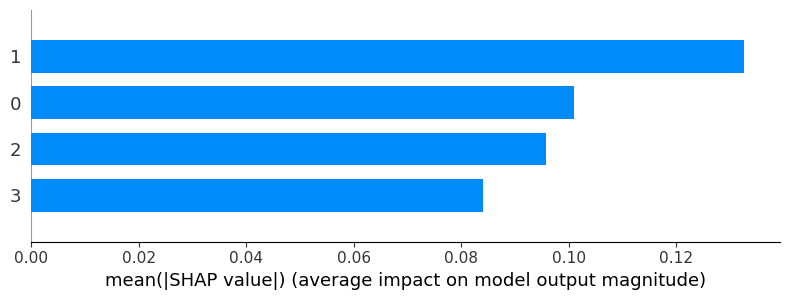

In [31]:
#---------------- SHAP LSTM ------------

import numpy as np
import shap

# Define the prediction function for LSTM-TabNet
def tabnet_lstm_predict(data):
    data = np.array(data)  # Ensure data is a NumPy array
    predictions = tabnet_lstm.predict_proba(data)  # Get the probability predictions
    return predictions  # Ensure the output is a NumPy array of probabilities

# Ensure the test features are in the correct format (2D array)
lstm_test_features = np.array(lstm_test_features)  # Convert lstm_test_features to a NumPy array if not already

# Convert to DataFrame to preserve feature names
lstm_test_features_df = pd.DataFrame(lstm_test_features)

# Check if lstm_test_features is 2D (n_samples, n_features)
print("Test features shape:", lstm_test_features_df.shape)  # Debugging line to check the shape

# Sample a subset for background and SHAP computation (you can adjust n=10 as per your data size)
background_lstm = lstm_test_features_df.sample(n=10, random_state=42)  # Select 10 samples for background

# Initialize SHAP explainer with the tabnet_lstm_predict function and the background data
explainer_lstm = shap.KernelExplainer(tabnet_lstm_predict, background_lstm)

# Compute SHAP values using the test features
shap_values_lstm = explainer_lstm.shap_values(lstm_test_features_df)
print("Shape of shap_values_lstm:", shap_values_lstm.shape)

# Debugging: Check the structure of SHAP values
print("Type of shap_values_lstm:", type(shap_values_lstm))

# If it's 3D, select the first class to visualize
if shap_values_lstm.ndim == 3:
    shap_values_to_plot_lstm = shap_values_lstm[:,:,1]  # Select first class's SHAP values
elif shap_values_lstm.ndim == 2:
    shap_values_to_plot_lstm = shap_values_lstm  # Directly use if it's already 2D
else:
    raise ValueError(f"Unexpected shape of SHAP values: {shap_values_lstm.shape}")

print("Shape of shap_values_lstm:", shap_values_to_plot_lstm.shape)

# Plot SHAP summary using the selected class's values and original test features
shap.summary_plot(shap_values_to_plot_lstm, lstm_test_features_df, plot_type="bar", max_display=30)


In [32]:
import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

# --- LSTM LIME EXPLANATION ---

# Initialize LIME explainer
explainer_lime = LimeTabularExplainer(
    training_data=lstm_test_features, 
    feature_names=lstm_test_features_df.columns,
    class_names=[str(i) for i in range(tabnet_lstm.predict_proba(lstm_test_features[:1]).shape[1])],
    mode='classification'
)

# Explain a single prediction (e.g., first test sample)
exp = explainer_lime.explain_instance(
    lstm_test_features[0], 
    tabnet_lstm_predict, 
    num_features=10
)

# Display LIME explanation
exp.show_in_notebook()

# Optional: Save LIME explanation as HTML
exp.save_to_file('D:/New Paper Try/ML/Obesity/Paper Obesity/Submission/New/data2_lime_lstm_explanation.html')


Shape of X2_test[0]: (14,)
Test sample shape: (1, 14, 1, 1)


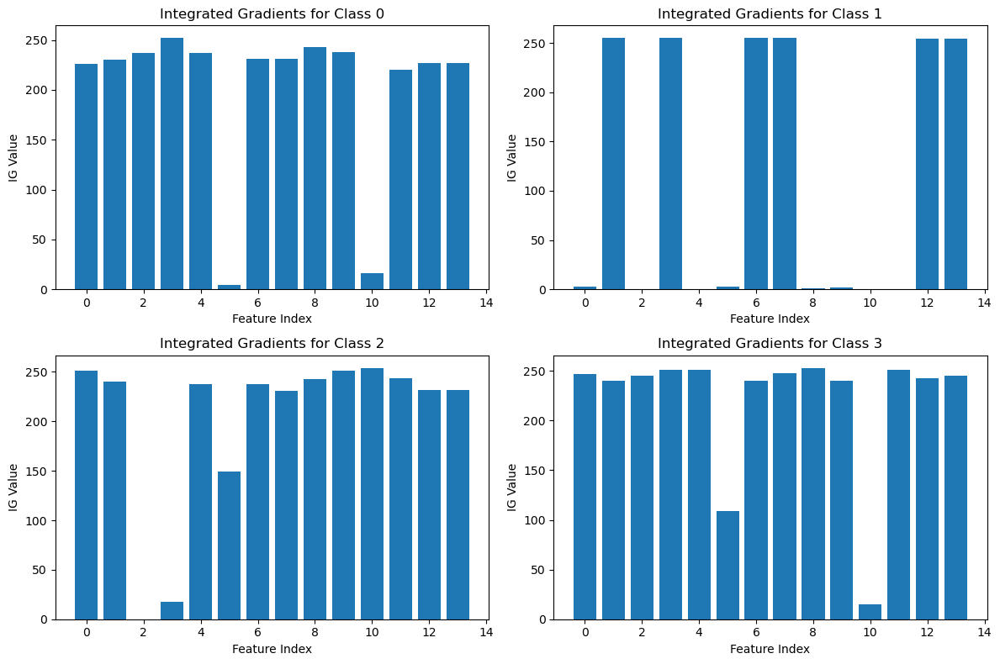

In [34]:
import tensorflow as tf
from tf_explain.core.integrated_gradients import IntegratedGradients
import numpy as np
import matplotlib.pyplot as plt

# Initialize IG explainer
ig_explainer = IntegratedGradients()

# Print shape of the test sample
print("Shape of X2_test[0]:", X2_test[0].shape)

# Correctly reshape the test sample for tf-explain
test_sample = np.expand_dims(X2_test[0].reshape(14, 1), axis=0)  
test_sample = np.expand_dims(test_sample, axis=2)  

# Verify the new shape
print("Test sample shape:", test_sample.shape)  

# Generate IG explanations for all 4 classes
num_classes = 4
ig_explanations = []

for class_index in range(num_classes):
    explanation = ig_explainer.explain(
        (test_sample, None),  # Input sample in expected format
        cnn_model,            # Your trained model
        class_index           # Class index to explain
    )
    ig_explanations.append(explanation)

# Plot Integrated Gradients for all classes in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

for i, ax in enumerate(axes.flat):
    if i < num_classes:  # Ensure we only plot available classes
        ax.bar(range(len(ig_explanations[i].flatten())), ig_explanations[i].flatten())
        ax.set_xlabel("Feature Index")
        ax.set_ylabel("IG Value")
        ax.set_title(f"Integrated Gradients for Class {i}")

plt.tight_layout()
plt.show()


Shape of X2_test[0]: (14,)
Test sample shape: (1, 14, 1, 1)


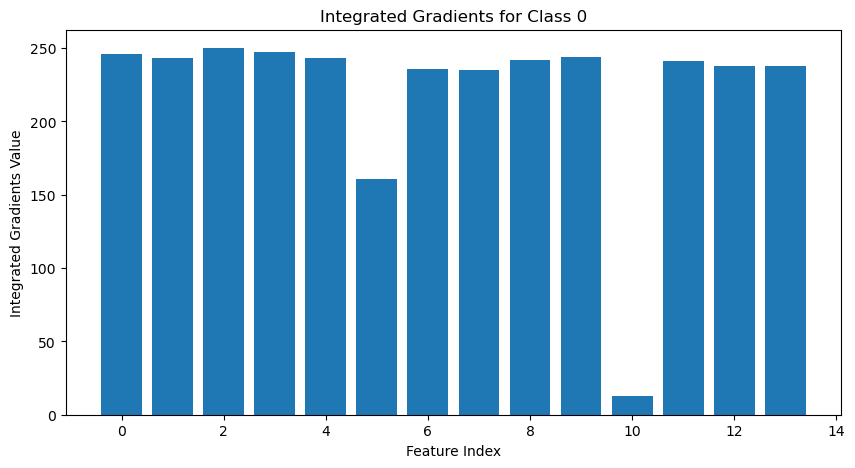

In [44]:
# import tensorflow as tf
# from tf_explain.core.integrated_gradients import IntegratedGradients
# import numpy as np

# import matplotlib.pyplot as plt

# ig_explainer = IntegratedGradients()

# print("Shape of X2_test[0]:", X2_test[0].shape)

# # Correctly reshape the test sample for tf-explain
# test_sample = np.expand_dims(X2_test[0].reshape(14, 1), axis=0)  # Shape: (1, 27, 1)
# test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 27, 1, 1)

# # Verify the new shape
# print("Test sample shape:", test_sample.shape)  # Should be (1, 27, 1, 1)

# # Specify the class index for which you want to explain the prediction
# class_index = 0  # Change this to the class you are interested in

# # Generate IG explanation
# cnn_ig_explanation = ig_explainer.explain(
#     (test_sample, None),  # Input sample in expected format
#     cnn_model,            # Your trained model
#     class_index           # Class index to explain
# )

# # Visualize Integrated Gradients using matplotlib
# # Since cnn_ig_explanation is now a numpy ndarray, we can directly use it
# integrated_gradients = cnn_ig_explanation

# # Plot using matplotlib
# plt.figure(figsize=(10, 5))
# plt.bar(range(len(integrated_gradients.flatten())), integrated_gradients.flatten())  # Flatten in case of multi-dimensional data
# plt.xlabel("Feature Index")
# plt.ylabel("Integrated Gradients Value")
# plt.title(f"Integrated Gradients for Class {class_index}")
# plt.show()



Test sample shape: (1, 14, 1, 1)


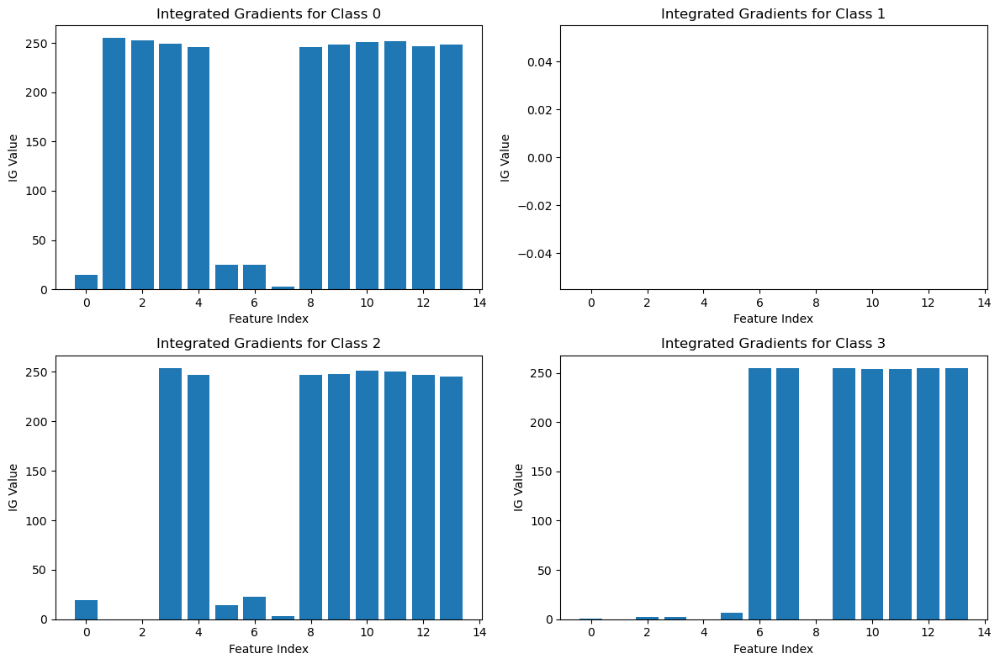

In [35]:
import tensorflow as tf
from tf_explain.core.integrated_gradients import IntegratedGradients
import numpy as np
import matplotlib.pyplot as plt

# Initialize IG explainer
ig_explainer = IntegratedGradients()

# Correctly reshape the test sample for tf-explain
test_sample = np.expand_dims(X2_test[0].reshape(14, 1), axis=0)  
test_sample = np.expand_dims(test_sample, axis=2)  

# Verify the new shape
print("Test sample shape:", test_sample.shape)  

# Generate IG explanations for all 4 classes
num_classes = 4
ig_explanations = []

for class_index in range(num_classes):
    explanation = ig_explainer.explain(
        (test_sample, None),  # Input sample in expected format
        lstm_model,           # Your trained model
        class_index           # Class index to explain
    )
    ig_explanations.append(explanation)

# Plot Integrated Gradients for all classes in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

for i, ax in enumerate(axes.flat):
    if i < num_classes:  # Ensure we only plot available classes
        ax.bar(range(len(ig_explanations[i].flatten())), ig_explanations[i].flatten())
        ax.set_xlabel("Feature Index")
        ax.set_ylabel("IG Value")
        ax.set_title(f"Integrated Gradients for Class {i}")

plt.tight_layout()
plt.show()


Test sample shape: (1, 14, 1, 1)


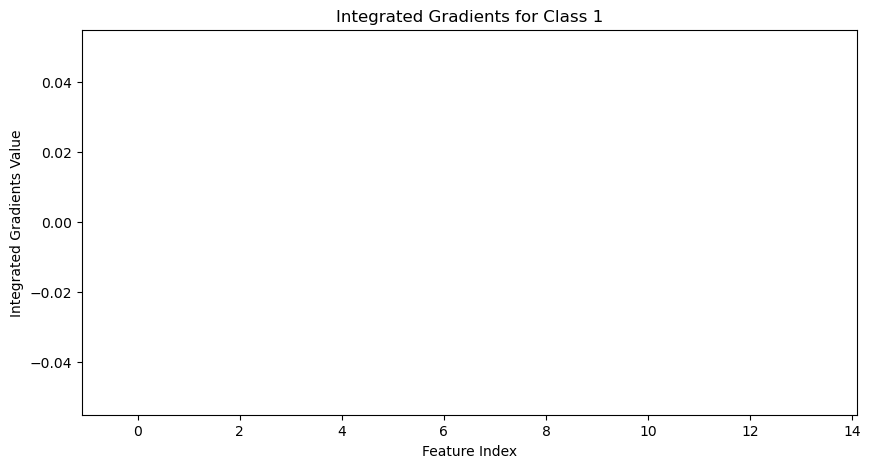

In [36]:
# import tensorflow as tf
# from tf_explain.core.integrated_gradients import IntegratedGradients
# import numpy as np

# import matplotlib.pyplot as plt

# ig_explainer = IntegratedGradients()

# # Correctly reshape the test sample for tf-explain
# test_sample = np.expand_dims(X2_test[0].reshape(14, 1), axis=0)  # Shape: (1, 27, 1)
# test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 27, 1, 1)

# # Verify the new shape
# print("Test sample shape:", test_sample.shape)  # Should be (1, 27, 1, 1)

# # Specify the class index for which you want to explain the prediction
# class_index = 1  # Change this to the class you are interested in

# # Generate IG explanation
# lstm_ig_explanation = ig_explainer.explain(
#     (test_sample, None),  # Input sample in expected format
#     lstm_model,            # Your trained model
#     class_index           # Class index to explain
# )

# # Visualize Integrated Gradients using matplotlib
# # Since cnn_ig_explanation is now a numpy ndarray, we can directly use it
# integrated_gradients = lstm_ig_explanation

# # Plot using matplotlib
# plt.figure(figsize=(10, 5))
# plt.bar(range(len(integrated_gradients.flatten())), integrated_gradients.flatten())  # Flatten in case of multi-dimensional data
# plt.xlabel("Feature Index")
# plt.ylabel("Integrated Gradients Value")
# plt.title(f"Integrated Gradients for Class {class_index}")
# plt.show()

# ORIGINAL DATASET

In [37]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler

In [9]:
# Load the dataset
file_path = r"D:/New Paper Try/ML/Obesity/New_obesity_levels.csv"
df = pd.read_csv(file_path)


In [48]:
# Ensure column names match dataset
df.columns = df.columns.str.strip()

# Separate features and target variable
X = df.drop(columns=['target'])  # Features
y = df['target']  # Target variable

In [49]:
# Apply SMOTE for balancing
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Create a new balanced DataFrame
df_balanced = pd.DataFrame(X_resampled, columns=X.columns)
df_balanced['target'] = y_resampled
df_balanced.to_csv("D:/New Paper Try/ML/Obesity/original.csv", index=False)

C:\Users\DIT\anaconda3\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\DIT\anaconda3\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
C:\Users\DIT\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2]

In [38]:
import shap
import lime
import lime.lime_tabular
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, Flatten, LSTM
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import StackingClassifier
import numpy as np
import shap
import torch
import optuna
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import LSTM, Bidirectional, Attention, Dense, Dropout, Conv1D, Flatten, Input
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from xgboost import XGBClassifier
from pytorch_tabnet.tab_model import TabNetClassifier
from tf_explain.core.integrated_gradients import IntegratedGradients
from sklearn.svm import SVC

In [39]:
# Split datasets
df = pd.read_csv(r"D:/New Paper Try/ML/Obesity/original.csv")


# Preprocess datasets
def preprocess_data(df):
    X = df.drop(columns=['target'])
    y = df['target']
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    return X_scaled, y, scaler, X.columns

X, y, scaler1, feature_names = preprocess_data(df)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [40]:
# ---------------- Hybrid Model 1: CNN + TabNet ----------------
def build_cnn_model(input_shape):
    model = Sequential([
        Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(4,activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

cnn_model = build_cnn_model((X_train.shape[1], 1))
cnn_model.fit(X_train.reshape(-1, X_train.shape[1], 1), y_train, epochs=10, batch_size=32, verbose=1)

Epoch 1/10
1021/1021 [==============================] - 4s 3ms/step - loss: 0.3465 - accuracy: 0.8760
Epoch 2/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2616 - accuracy: 0.9074
Epoch 3/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2458 - accuracy: 0.9134
Epoch 4/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2357 - accuracy: 0.9187
Epoch 5/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2303 - accuracy: 0.9188
Epoch 6/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2261 - accuracy: 0.9229
Epoch 7/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2219 - accuracy: 0.9243
Epoch 8/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2174 - accuracy: 0.9261
Epoch 9/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.2143 - accuracy: 0.9252
Epoch 10/10
1021/1021 [==============================] - 3s 3ms/step - loss: 0.210

In [41]:
# Extract CNN-generated features

cnn_train_features = cnn_model.predict(X_train.reshape(-1, X_train.shape[1], 1))
cnn_test_features = cnn_model.predict(X_test.reshape(-1, X_test.shape[1], 1))

# Train TabNet on CNN-generated features
tabnet_cnn = TabNetClassifier()
tabnet_cnn.fit(cnn_train_features, y_train)
cnn_tabnet_preds = tabnet_cnn.predict(cnn_test_features)

print("CNN + TabNet Accuracy:", accuracy_score(y_test, cnn_tabnet_preds))

256/256 [==============================] - 1s 3ms/step


C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")
C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 0.48527 |  0:00:02s
epoch 1  | loss: 0.21146 |  0:00:04s
epoch 2  | loss: 0.19758 |  0:00:06s
epoch 3  | loss: 0.19647 |  0:00:07s
epoch 4  | loss: 0.19526 |  0:00:09s
epoch 5  | loss: 0.19381 |  0:00:11s
epoch 6  | loss: 0.19405 |  0:00:13s
epoch 7  | loss: 0.19082 |  0:00:15s
epoch 8  | loss: 0.191   |  0:00:17s
epoch 9  | loss: 0.19061 |  0:00:19s
epoch 10 | loss: 0.19194 |  0:00:21s
epoch 11 | loss: 0.19031 |  0:00:22s
epoch 12 | loss: 0.19004 |  0:00:24s
epoch 13 | loss: 0.19213 |  0:00:26s
epoch 14 | loss: 0.18906 |  0:00:28s
epoch 15 | loss: 0.18962 |  0:00:30s
epoch 16 | loss: 0.18901 |  0:00:32s
epoch 17 | loss: 0.18847 |  0:00:34s
epoch 18 | loss: 0.18972 |  0:00:36s
epoch 19 | loss: 0.18861 |  0:00:38s
epoch 20 | loss: 0.18885 |  0:00:40s
epoch 21 | loss: 0.18867 |  0:00:42s
epoch 22 | loss: 0.18896 |  0:00:44s
epoch 23 | loss: 0.18774 |  0:00:46s
epoch 24 | loss: 0.18835 |  0:00:48s
epoch 25 | loss: 0.18762 |  0:00:50s
epoch 26 | loss: 0.18663 |  0:00:52s
e

[[1.0668323e-05 2.0934337e-06 9.7733355e-01 2.2653665e-02]
 [1.0779855e-03 9.9891996e-01 2.1165231e-06 1.9563494e-08]
 [5.0388236e-02 9.4961035e-01 1.4474566e-06 7.6639772e-10]
 ...
 [7.8222230e-03 9.9213153e-01 4.6281668e-05 8.8577217e-09]
 [5.2996898e-30 1.3097890e-13 1.2417258e-13 1.0000000e+00]
 [5.6152992e-05 1.6636917e-03 9.4003606e-01 5.8244109e-02]]


  0%|          | 0/100 [00:00<?, ?it/s]

Shape of shap_values_cnn: (100, 4, 4)
Type of shap_values_cnn: <class 'numpy.ndarray'>
Shape of shap_values_cnn: (100, 4)


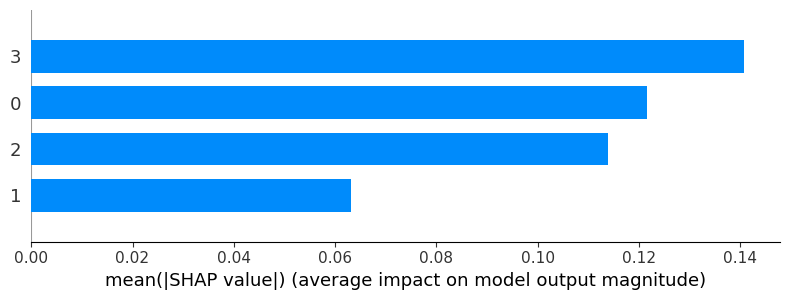

In [42]:
# Import necessary libraries

#----------- CNN+TAbnet SHAP ------------------

import numpy as np
import pandas as pd
import shap

print(cnn_test_features)
# Ensure cnn_test_features is a NumPy array
cnn_test_features = np.array(cnn_test_features)

# Convert to DataFrame to preserve feature names
cnn_test_features_df = pd.DataFrame(cnn_test_features)

# Define prediction function for TabNet model
def tabnet_predict(data):
    data = np.array(data)  # Convert to NumPy array
    predictions = tabnet_cnn.predict_proba(data)  # Get probability predictions
    return predictions  # Returns probabilities for all classes

# Sample a subset for background and SHAP computation
background = cnn_test_features_df.sample(n=10, random_state=42)
cnn_test_sample_df = cnn_test_features_df.sample(n=100, random_state=42)
cnn_test_sample = cnn_test_sample_df.values  # Convert to NumPy for KernelExplainer

# Initialize SHAP KernelExplainer with the prediction function and background
explainer_cnn = shap.KernelExplainer(tabnet_predict, background)

# Compute SHAP values using the NumPy array
shap_values_cnn = explainer_cnn.shap_values(cnn_test_sample)
print("Shape of shap_values_cnn:", shap_values_cnn.shape)


# Debugging: Check the structure of SHAP values
print("Type of shap_values_cnn:", type(shap_values_cnn))

# If it's 3D, select the first class to visualize
if shap_values_cnn.ndim == 3:
    shap_values_to_plot = shap_values_cnn[:,:,1]  # Select first class's SHAP values
elif shap_values_cnn.ndim == 2:
    shap_values_to_plot = shap_values_cnn  # Directly use if it's already 2D
else:
    raise ValueError(f"Unexpected shape of SHAP values: {shap_values_cnn.shape}")
    
print("Shape of shap_values_cnn:", shap_values_to_plot.shape)

# Plot SHAP summary using the selected class's values and original DataFrame
shap.summary_plot(shap_values_to_plot, cnn_test_sample_df, plot_type="bar", max_display=20)

In [43]:
import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

# --- CNN LIME EXPLANATION ---

# Initialize LIME explainer
explainer_lime = LimeTabularExplainer(
    training_data=cnn_test_features, 
    feature_names=cnn_test_features_df.columns,
    class_names=[str(i) for i in range(tabnet_cnn.predict_proba(cnn_test_features[:1]).shape[1])],
    mode='classification'
)

# Explain a single prediction (e.g., first test sample)
exp = explainer_lime.explain_instance(
    cnn_test_features[0], 
    tabnet_predict, 
    num_features=10
)

# Display LIME explanation
exp.show_in_notebook()

# Optional: Save LIME explanation as HTML
exp.save_to_file('D:/New Paper Try/ML/Obesity/Paper Obesity/Submission/New/ori_cnn_explanation.html')

In [44]:
# ---------------- Hybrid Model 2: Self-Attention BiLSTM + TabNet ----------------
def build_lstm_attention_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Bidirectional(LSTM(64, return_sequences=True))(inputs)
    
    # Self-attention mechanism
    attention = Attention()([x, x])
    
    x = LSTM(32)(attention)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(4, activation='softmax')(x)

    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

lstm_model = build_lstm_attention_model((X_train.shape[1], 1))
lstm_model.fit(X_train.reshape(-1, X_train.shape[1], 1), y_train, epochs=10, batch_size=32, verbose=1)


Epoch 1/10
1021/1021 [==============================] - 21s 15ms/step - loss: 0.9573 - accuracy: 0.5427
Epoch 2/10
1021/1021 [==============================] - 15s 15ms/step - loss: 0.8100 - accuracy: 0.6379
Epoch 3/10
1021/1021 [==============================] - 21s 21ms/step - loss: 0.7284 - accuracy: 0.6826
Epoch 4/10
1021/1021 [==============================] - 17s 17ms/step - loss: 0.6085 - accuracy: 0.7418
Epoch 5/10
1021/1021 [==============================] - 15s 14ms/step - loss: 0.3677 - accuracy: 0.8570
Epoch 6/10
1021/1021 [==============================] - 15s 14ms/step - loss: 0.2775 - accuracy: 0.9013
Epoch 7/10
1021/1021 [==============================] - 15s 15ms/step - loss: 0.2590 - accuracy: 0.9097
Epoch 8/10
1021/1021 [==============================] - 15s 15ms/step - loss: 0.2504 - accuracy: 0.9128
Epoch 9/10
1021/1021 [==============================] - 15s 14ms/step - loss: 0.2528 - accuracy: 0.9146
Epoch 10/10
1021/1021 [==============================] - 14s 14m

In [45]:
# Extract LSTM-generated features
lstm_train_features = lstm_model.predict(X_train.reshape(-1, X_train.shape[1], 1))
lstm_test_features = lstm_model.predict(X_test.reshape(-1, X_test.shape[1], 1))

# Train TabNet on LSTM-generated features
tabnet_lstm = TabNetClassifier()
tabnet_lstm.fit(lstm_train_features, y_train)
lstm_tabnet_preds = tabnet_lstm.predict(lstm_test_features)

print("LSTM + TabNet Accuracy:", accuracy_score(y_test, lstm_tabnet_preds))

256/256 [==============================] - 2s 6ms/step


C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")
C:\Users\DIT\anaconda3\Lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 0.55093 |  0:00:01s
epoch 1  | loss: 0.24169 |  0:00:03s
epoch 2  | loss: 0.2291  |  0:00:05s
epoch 3  | loss: 0.22947 |  0:00:07s
epoch 4  | loss: 0.22616 |  0:00:09s
epoch 5  | loss: 0.2253  |  0:00:11s
epoch 6  | loss: 0.22653 |  0:00:13s
epoch 7  | loss: 0.22275 |  0:00:15s
epoch 8  | loss: 0.22133 |  0:00:17s
epoch 9  | loss: 0.22304 |  0:00:19s
epoch 10 | loss: 0.22186 |  0:00:21s
epoch 11 | loss: 0.22049 |  0:00:23s
epoch 12 | loss: 0.22014 |  0:00:25s
epoch 13 | loss: 0.22    |  0:00:27s
epoch 14 | loss: 0.21833 |  0:00:29s
epoch 15 | loss: 0.21989 |  0:00:31s
epoch 16 | loss: 0.21987 |  0:00:33s
epoch 17 | loss: 0.22082 |  0:00:35s
epoch 18 | loss: 0.22201 |  0:00:37s
epoch 19 | loss: 0.22127 |  0:00:39s
epoch 20 | loss: 0.22079 |  0:00:41s
epoch 21 | loss: 0.21894 |  0:00:43s
epoch 22 | loss: 0.22014 |  0:00:45s
epoch 23 | loss: 0.2199  |  0:00:47s
epoch 24 | loss: 0.21882 |  0:00:49s
epoch 25 | loss: 0.21774 |  0:00:51s
epoch 26 | loss: 0.21782 |  0:00:52s
e

Test features shape: (8164, 4)


  0%|          | 0/8164 [00:00<?, ?it/s]

Shape of shap_values_lstm: (8164, 4, 4)
Type of shap_values_lstm: <class 'numpy.ndarray'>
Shape of shap_values_lstm: (8164, 4)


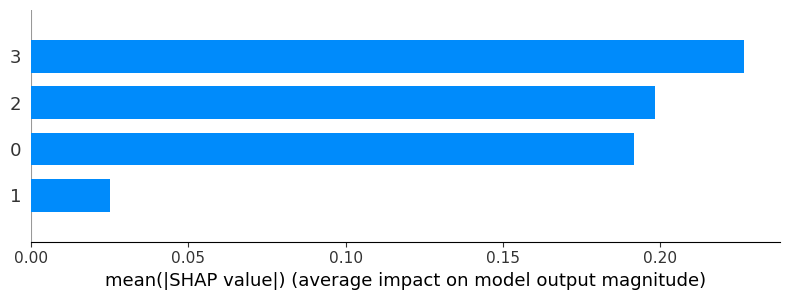

In [46]:
#---------------- SHAP LSTM ------------

import numpy as np
import shap

# Define the prediction function for LSTM-TabNet
def tabnet_lstm_predict(data):
    data = np.array(data)  # Ensure data is a NumPy array
    predictions = tabnet_lstm.predict_proba(data)  # Get the probability predictions
    return predictions  # Ensure the output is a NumPy array of probabilities

# Ensure the test features are in the correct format (2D array)
lstm_test_features = np.array(lstm_test_features)  # Convert lstm_test_features to a NumPy array if not already

# Convert to DataFrame to preserve feature names
lstm_test_features_df = pd.DataFrame(lstm_test_features)

# Check if lstm_test_features is 2D (n_samples, n_features)
print("Test features shape:", lstm_test_features_df.shape)  # Debugging line to check the shape

# Sample a subset for background and SHAP computation (you can adjust n=10 as per your data size)
background_lstm = lstm_test_features_df.sample(n=10, random_state=42)  # Select 10 samples for background

# Initialize SHAP explainer with the tabnet_lstm_predict function and the background data
explainer_lstm = shap.KernelExplainer(tabnet_lstm_predict, background_lstm)

# Compute SHAP values using the test features
shap_values_lstm = explainer_lstm.shap_values(lstm_test_features_df)
print("Shape of shap_values_lstm:", shap_values_lstm.shape)

# Debugging: Check the structure of SHAP values
print("Type of shap_values_lstm:", type(shap_values_lstm))

# If it's 3D, select the first class to visualize
if shap_values_lstm.ndim == 3:
    shap_values_to_plot_lstm = shap_values_lstm[:,:,1]  # Select first class's SHAP values
elif shap_values_lstm.ndim == 2:
    shap_values_to_plot_lstm = shap_values_lstm  # Directly use if it's already 2D
else:
    raise ValueError(f"Unexpected shape of SHAP values: {shap_values_lstm.shape}")

print("Shape of shap_values_lstm:", shap_values_to_plot_lstm.shape)

# Plot SHAP summary using the selected class's values and original test features
shap.summary_plot(shap_values_to_plot_lstm, lstm_test_features_df, plot_type="bar", max_display=30)


In [47]:
import lime
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

# --- LSTM LIME EXPLANATION ---

# Initialize LIME explainer
explainer_lime = LimeTabularExplainer(
    training_data=lstm_test_features, 
    feature_names=lstm_test_features_df.columns,
    class_names=[str(i) for i in range(tabnet_lstm.predict_proba(lstm_test_features[:1]).shape[1])],
    mode='classification'
)

# Explain a single prediction (e.g., first test sample)
exp = explainer_lime.explain_instance(
    lstm_test_features[0], 
    tabnet_lstm_predict, 
    num_features=10
)

# Display LIME explanation
exp.show_in_notebook()

# Optional: Save LIME explanation as HTML
exp.save_to_file('D:/New Paper Try/ML/Obesity/Paper Obesity/Submission/New/ori_lime_lstm_explanation.html')

Shape of X_test[0]: (16,)
Test sample shape: (1, 16, 1, 1)


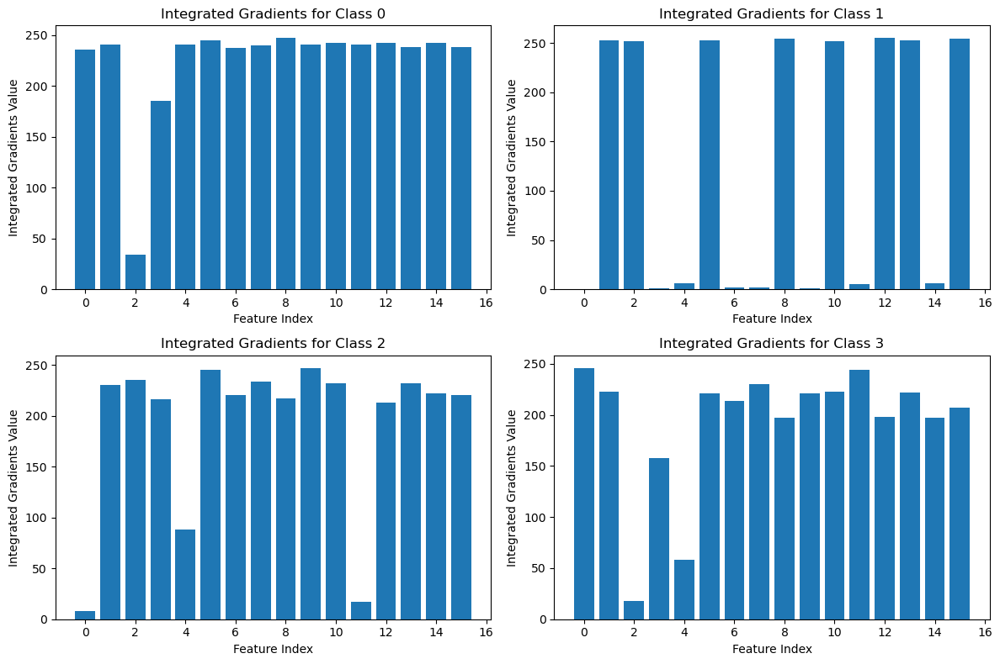

In [48]:
import tensorflow as tf
from tf_explain.core.integrated_gradients import IntegratedGradients
import numpy as np
import matplotlib.pyplot as plt

ig_explainer = IntegratedGradients()

print("Shape of X_test[0]:", X_test[0].shape)

# Correctly reshape the test sample for tf-explain
test_sample = np.expand_dims(X_test[0].reshape(16, 1), axis=0)  # Shape: (1, 16, 1)
test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 16, 1, 1)

# Verify the new shape
print("Test sample shape:", test_sample.shape)  # Should be (1, 16, 1, 1)

# Number of classes
num_classes = 4

# Create a 2x2 grid for visualization
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

for class_index in range(num_classes):
    # Generate IG explanation
    cnn_ig_explanation = ig_explainer.explain(
        (test_sample, None),  # Input sample in expected format
        cnn_model,            # Your trained model
        class_index           # Class index to explain
    )
    
    # Flatten the integrated gradients
    integrated_gradients = cnn_ig_explanation.flatten()
    
    # Plot using matplotlib
    axes[class_index].bar(range(len(integrated_gradients)), integrated_gradients)
    axes[class_index].set_xlabel("Feature Index")
    axes[class_index].set_ylabel("Integrated Gradients Value")
    axes[class_index].set_title(f"Integrated Gradients for Class {class_index}")

plt.tight_layout()
plt.show()


In [ ]:
# import tensorflow as tf
# from tf_explain.core.integrated_gradients import IntegratedGradients
# import numpy as np

# import matplotlib.pyplot as plt

# ig_explainer = IntegratedGradients()

# print("Shape of X_test[0]:", X_test[0].shape)

# # Correctly reshape the test sample for tf-explain
# test_sample = np.expand_dims(X2_test[0].reshape(16, 1), axis=0)  # Shape: (1, 27, 1)
# test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 27, 1, 1)

# # Verify the new shape
# print("Test sample shape:", test_sample.shape)  # Should be (1, 27, 1, 1)

# # Specify the class index for which you want to explain the prediction
# class_index = 0  # Change this to the class you are interested in

# # Generate IG explanation
# cnn_ig_explanation = ig_explainer.explain(
#     (test_sample, None),  # Input sample in expected format
#     cnn_model,            # Your trained model
#     class_index           # Class index to explain
# )

# # Visualize Integrated Gradients using matplotlib
# # Since cnn_ig_explanation is now a numpy ndarray, we can directly use it
# integrated_gradients = cnn_ig_explanation

# # Plot using matplotlib
# plt.figure(figsize=(10, 5))
# plt.bar(range(len(integrated_gradients.flatten())), integrated_gradients.flatten())  # Flatten in case of multi-dimensional data
# plt.xlabel("Feature Index")
# plt.ylabel("Integrated Gradients Value")
# plt.title(f"Integrated Gradients for Class {class_index}")
# plt.show()

In [1]:
import tensorflow as tf
from tf_explain.core.integrated_gradients import IntegratedGradients
import numpy as np
import matplotlib.pyplot as plt

ig_explainer = IntegratedGradients()

# Correctly reshape the test sample for tf-explain
test_sample = np.expand_dims(X_test[0].reshape(16, 1), axis=0)  # Shape: (1, 16, 1)
test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 16, 1, 1)

# Verify the new shape
print("Test sample shape:", test_sample.shape)  # Should be (1, 16, 1, 1)

# Number of classes
num_classes = 5

# Create a 2x2 grid for visualization
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

for class_index in range(num_classes):
    # Generate IG explanation
    lstm_ig_explanation = ig_explainer.explain(
        (test_sample, None),  # Input sample in expected format
        lstm_model,           # Your trained model
        class_index           # Class index to explain
    )
    
    # Flatten the integrated gradients
    integrated_gradients = lstm_ig_explanation.flatten()
    
    # Plot using matplotlib
    axes[class_index].bar(range(len(integrated_gradients)), integrated_gradients)
    axes[class_index].set_xlabel("Feature Index")
    axes[class_index].set_ylabel("Integrated Gradients Value")
    axes[class_index].set_title(f"Integrated Gradients for Class {class_index}")

plt.tight_layout()
plt.show()


NameError: name 'X_test' is not defined

In [ ]:
# import tensorflow as tf
# from tf_explain.core.integrated_gradients import IntegratedGradients
# import numpy as np

# import matplotlib.pyplot as plt

# ig_explainer = IntegratedGradients()

# # Correctly reshape the test sample for tf-explain
# test_sample = np.expand_dims(X_test[0].reshape(16, 1), axis=0)  # Shape: (1, 27, 1)
# test_sample = np.expand_dims(test_sample, axis=2)  # Shape: (1, 27, 1, 1)

# # Verify the new shape
# print("Test sample shape:", test_sample.shape)  # Should be (1, 27, 1, 1)

# # Specify the class index for which you want to explain the prediction
# class_index = 0  # Change this to the class you are interested in

# # Generate IG explanation
# lstm_ig_explanation = ig_explainer.explain(
#     (test_sample, None),  # Input sample in expected format
#     lstm_model,            # Your trained model
#     class_index           # Class index to explain
# )

# # Visualize Integrated Gradients using matplotlib
# # Since cnn_ig_explanation is now a numpy ndarray, we can directly use it
# integrated_gradients = lstm_ig_explanation

# # Plot using matplotlib
# plt.figure(figsize=(10, 5))
# plt.bar(range(len(integrated_gradients.flatten())), integrated_gradients.flatten())  # Flatten in case of multi-dimensional data
# plt.xlabel("Feature Index")
# plt.ylabel("Integrated Gradients Value")
# plt.title(f"Integrated Gradients for Class {class_index}")
# plt.show()